<a href="https://colab.research.google.com/github/JimmyNunnally/unit_dashboard/blob/main/unit_dash.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#@title Load libraries and data
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import seaborn as sns

#read from github
url='https://raw.githubusercontent.com/JimmyNunnally/unit_dashboard/main/MTOE_v3.csv'
df = pd.read_csv(url, index_col=0)
print(df.head(5))

In [ ]:
#@title read from excel
xl_file = pd.ExcelFile('/content/MTOE_v3.xlsx')

dfs = {sheet_name: xl_file.parse(sheet_name) 
          for sheet_name in xl_file.sheet_names}

from pandas import read_excel
file = '/content/MTOE_v3.xlsx'
xl = pd.ExcelFile(file)
print(xl.sheet_names)
df1 = xl.parse('Personnel 2CR')
df = read_excel(file, sheet_name = 'Personnel 2CR')          

In [3]:
fig = px.pie(df, names = "Position", hole = .15, title = "2CR personell",
             color_discrete_sequence = px.colors.qualitative.Light24,)

fig.update_traces(textposition = "inside", textinfo = "percent+value")
fig.show()

In [ ]:
fig = px.pie(df, names = "BN", hole = .15, title = "Battalians in the 2CR",
             color_discrete_sequence = px.colors.qualitative.Light24,)

fig.update_traces(textposition = "inside", textinfo = "percent+value")
fig.show()

In [ ]:
#@title Setting up map
#Needed for maps
pip install geopandas

In [ ]:
#@title Map data
import geopandas as gpd
countries = gpd.read_file(
               gpd.datasets.get_path("naturalearth_lowres"))
#countries.head()
# create a list of our conditions
conditions = [
    (df['BN'] == '2CRHQ'),
    (df['BN'] == '1SQN2CR'),
    (df['BN'] == '2SQN2CR'),
    (df['BN'] == '3SQN2CR' ),
     (df['BN'] == '4SQN2CR' )
    ]

# create a list of the values we want to assign for each condition
values = [32, 36, 35, 38, 34]

# create a new column and use np.select to assign values to it using our lists as arguments
df['lat'] = np.select(conditions, values)

# display updated DataFrame
#df.head()


# create a list of our conditions
conditions = [
    (df['BN'] == '2CRHQ'),
    (df['BN'] == '1SQN2CR'),
    (df['BN'] == '2SQN2CR'),
    (df['BN'] == '3SQN2CR' ),
     (df['BN'] == '4SQN2CR' )
    ]

# create a list of the values we want to assign for each condition
values2 = [50, 46, 45, 48,49]

# create a new column and use np.select to assign values to it using our lists as arguments
df['long'] = np.select(conditions, values2)

# display updated DataFrame
#df.head()

import numpy as np
df['readiness'] = np.random.randint(1, 4, df1.shape[0])
df['name'] = 'Ukraine'


,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


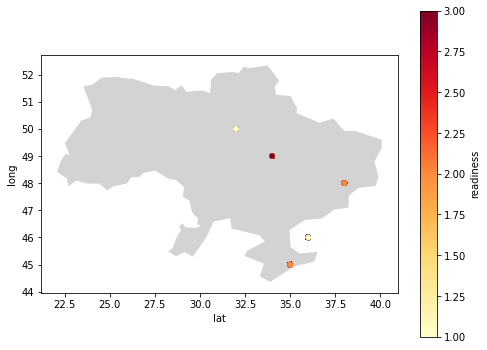

In [ ]:
# initialize an axis
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8,6))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
base= (countries[countries["name"] == "Ukraine"].plot(color="lightgrey",
                                                 ax=ax))

df.plot(x="lat", y="long", kind="scatter", 
        c='readiness', colormap="YlOrRd", legend=True, ax=base)
        


In [ ]:
#@title Set up firepower
USCR = ['2CRHQ','1SQN2CR','2SQN2CR','3SQN2CR','4SQN2CR']
RUTR = ['20TRHQ','1SQN20TR','2SQN20TR','3SQN20TR','4SQN20TR']

dfRU = pd.DataFrame(RUTR , columns=['BN'])
dfUS = pd.DataFrame(USCR , columns=['BN'])

dfRU['Firepower'] = np.random.randint(500, 1500, dfRU.shape[0])
dfUS['Firepower'] = np.random.randint(700, 1800, dfUS.shape[0])

dfRU['Country'] = 'Russia'
dfUS['Country'] = 'USA'

conditions = [
    (dfUS['BN'] == '2CRHQ'),
    (dfUS['BN'] == '1SQN2CR'),
    (dfUS['BN'] == '2SQN2CR'),
    (dfUS['BN'] == '3SQN2CR' ),
     (dfUS['BN'] == '4SQN2CR' )
    ]

# create a list of the values we want to assign for each condition
values = [32, 36, 35, 38, 34]

# create a new column and use np.select to assign values to it using our lists as arguments
dfUS['lat'] = np.select(conditions, values)

conditions2 = [
    (dfUS['BN'] == '2CRHQ'),
    (dfUS['BN'] == '1SQN2CR'),
    (dfUS['BN'] == '2SQN2CR'),
    (dfUS['BN'] == '3SQN2CR' ),
     (dfUS['BN'] == '4SQN2CR' )
    ]

# create a list of the values we want to assign for each condition
values2 = [50, 46, 45, 48,49]

# create a new column and use np.select to assign values to it using our lists as arguments
dfUS['long'] = np.select(conditions, values2)

dfRU['lat']=dfUS['lat']+1
dfRU['long']=dfUS['long']


In [ ]:
dfRU['Country2']=1
dfUS['Country2']=0
df2= pd.merge(dfRU,dfUS, how='outer')
df2

,BN,Firepower,Country,lat,long,Country2
0,20TRHQ,1431,Russia,33,50,1
1,1SQN20TR,1056,Russia,37,46,1
2,2SQN20TR,628,Russia,36,45,1
3,3SQN20TR,1369,Russia,39,48,1
4,4SQN20TR,723,Russia,35,49,1
5,2CRHQ,1790,USA,32,50,0
6,1SQN2CR,1509,USA,36,46,0
7,2SQN2CR,1045,USA,35,45,0
8,3SQN2CR,1295,USA,38,48,0
9,4SQN2CR,824,USA,34,49,0


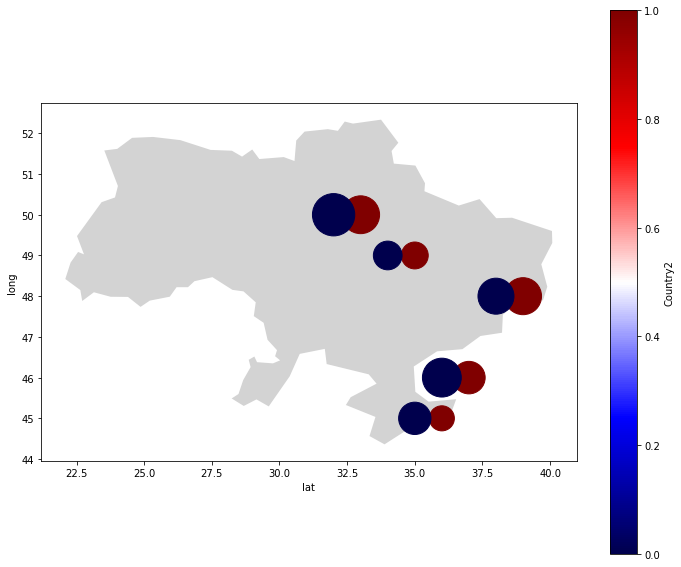

In [ ]:
fig, ax = plt.subplots(figsize=(12,10))
# plot map on axis
countries = gpd.read_file(  
     gpd.datasets.get_path("naturalearth_lowres"))
base= (countries[countries["name"] == "Ukraine"].plot(color="lightgrey",
                                                 ax=ax))

df2.plot(x="lat", y="long", kind="scatter", 
        c= 'Country2', s='Firepower',  colormap="seismic", legend=True, ax=base)


In [ ]:
#!pip install folium matplotlib mapclassify
merge=pd.merge(countries,df,on='name')

In [ ]:
ukraine= merge[merge['name'] =='Ukraine']
ukraine.explore(column="readiness")